In [ ]:
!git clone https://github.com/openai/CLIP
!pip install ftfy


Cloning into 'CLIP'...
remote: Enumerating objects: 256, done.
remote: Total 256 (delta 0), reused 0 (delta 0), pack-reused 256
Receiving objects: 100% (256/256), 8.93 MiB | 33.60 MiB/s, done.
Resolving deltas: 100% (133/133), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.0/43.0 kB 1.8 MB/s eta 0:00:00


In [ ]:
import os
import zipfile
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from tqdm import tqdm
from google.colab import drive
from CLIP import clip

from parameters import *


In [ ]:


# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Path to your zip file
zip_path = '/content/drive/MyDrive/wikiart.zip'
# Directory where you want to extract the files
extract_path = '/content/dataset'

# Create the extraction directory if it doesn't exist
os.makedirs(extract_path, exist_ok=True)

# Function to list folder names in the zip file
def list_folders_in_zip(zip_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        all_folders = set()
        for member in zip_ref.infolist():
            parts = member.filename.split('/')
            if len(parts) > 2:  # Ensure there's a subfolder
                folder_name = parts[1]
                all_folders.add(folder_name)
        return sorted(list(all_folders))

# Function to extract only JPEG files from specified folders
def safe_extract_jpeg(zip_path, extract_path, folders, max_files_per_folder=1000):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        folder_file_count = {folder: 0 for folder in folders}

        for member in zip_ref.infolist():
            filename = member.filename.lower()
            parts = member.filename.split('/')
            if filename.endswith('.jpg') and len(parts) > 2:  # Ensure there's a subfolder
                folder_name = parts[1]
                if folder_name in folders and folder_file_count[folder_name] < max_files_per_folder:
                    try:
                        zip_ref.extract(member, extract_path)
                        folder_file_count[folder_name] += 1
                    except Exception:
                        # Silently skip the corrupted file
                        continue

# List all folders in the zip file
all_folders = list_folders_in_zip(zip_path)

# Get the folders at the specified positions
positions = [1, 4, 5, 8, 10, 13, 20, 22, 23]
folders_to_extract = [all_folders[pos - 1] for pos in positions]

# Extract the zip file if the directory is empty
if not os.listdir(extract_path):
    safe_extract_jpeg(zip_path, extract_path, folders_to_extract)

# Update dataroot to the extracted path
dataroot = extract_path
print(f"Updated dataroot: {dataroot}")



Mounted at /content/drive
Updated dataroot: /content/dataset


Random Seed:  999


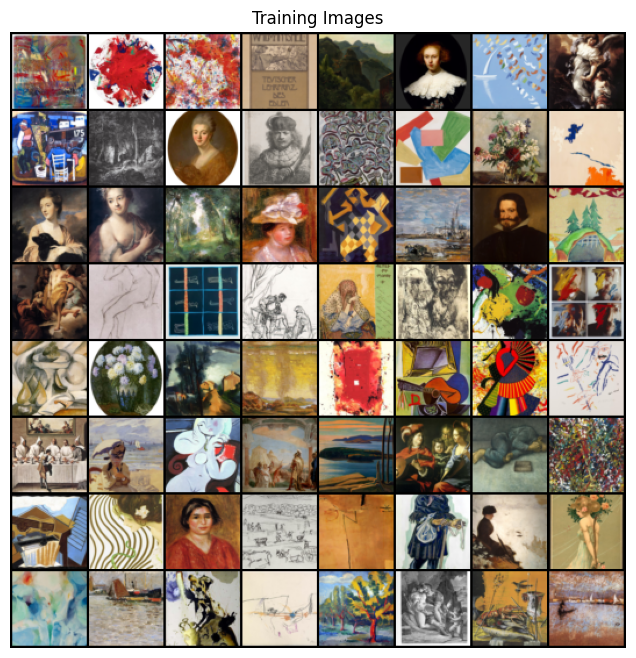

In [ ]:
# Set random seed for reproducibility
manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

# Create the dataloader
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])


dataset = dset.ImageFolder(root=dataroot, transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)


device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

In [ ]:
# Custom loss function to guide image generation towards a specific text prompt using CLIP embeddings
class Prompt(nn.Module):
    def __init__(self, embed, weight=1.0, stop=False):
        super(Prompt, self).__init__()
        self.embed = embed  # CLIP embedding for the prompt
        self.weight = weight  # Weight for this prompt in the overall loss
        self.stop = stop  # Flag to stop gradient flow through this prompt

    def forward(self, image):
        # Handle the batch of images
        batch_size = image.size(0)
        image_features_list = []

        for i in range(batch_size):
            # Convert tensor to PIL Image
            image_pil = transforms.ToPILImage()(image[i].cpu())
            image_processed = preprocess(image_pil).unsqueeze(0).to(device)
            with torch.no_grad():
                image_features = perceptor.encode_image(image_processed)  # Encode image to CLIP features
            image_features /= image_features.norm(dim=-1, keepdim=True)  # Normalize features
            image_features_list.append(image_features)

        image_features = torch.cat(image_features_list)
        embed_normalized = self.embed / self.embed.norm()  # Normalize prompt embedding
        cosine_similarity = (image_features * embed_normalized).sum(dim=-1).clamp(-1, 1)  # Compute cosine similarity
        return -self.weight * cosine_similarity.mean()  # Return negative cosine similarity as loss



In [ ]:
from PIL import Image
# Custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Generator(nn.Module):
    def __init__(self, ngpu, nz, nc, ngf, n_class):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.nz = nz
        self.ngf = ngf
        self.n_class = n_class
        self.project_prompt = nn.Linear(512, n_class)  # Linear layer to project CLIP's 512-dimensional embedding
        self.main = nn.Sequential(
            # Input is (nz + n_class) x 1 x 1
            nn.ConvTranspose2d(nz + n_class, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # State size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # State size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # State size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # State size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # State size. (nc) x 64 x 64
        )

    def forward(self, input, prompt_embed):
        # Ensure prompt_embed is correctly projected and concatenated with input
        prompt_embed_resized = prompt_embed.view(prompt_embed.size(0), prompt_embed.size(1))
        prompt_embed_projected = self.project_prompt(prompt_embed_resized)
        prompt_embed_projected = prompt_embed_projected.view(prompt_embed_projected.size(0), prompt_embed_projected.size(1), 1, 1)
        input_and_prompt = torch.cat((input, prompt_embed_projected), 1)
        return self.main(input_and_prompt)

class Discriminator(nn.Module):
    def __init__(self, ngpu, nc, ndf, n_class):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.nz = nc
        self.ndf = ndf
        self.n_class = n_class
        self.main = nn.Sequential(
            # Input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # State size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # State size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # State size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # State size. (ndf*8) x 4 x 4
        )

        # Outputs the probability of the input being real or fake
        self.discriminate = nn.Sequential(
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

        # Outputs class probabilities for the input
        self.classify = nn.Sequential(
            nn.Conv2d(ndf * 8, n_class, 4, 1, 0, bias=False)
        )

    def forward(self, input):
        x = self.main(input)
        d_out = self.discriminate(x)
        c_out = self.classify(x)
        return d_out, c_out



# Training function
def train(num_epochs, dataloader, netG, netD, optimizerG, optimizerD, criterion, criterion_style, device, fixed_noise, pMs, prompts):
    img_list = []
    G_losses = []
    D_losses = []
    similarity_scores_over_time = []
    similarity_scores_dict = {}
    iters = 0

    # Ensure your image directory exists
    image_save_dir = 'training_images'
    os.makedirs(image_save_dir, exist_ok=True)

    real_label = 1.0
    fake_label = 0.0

    for epoch in range(num_epochs):
        for i, (data, style_label) in enumerate(dataloader):
            ############################
            # (1) Update D network
            ###########################
            netD.zero_grad()
            style_label = style_label.to(device)
            real_cpu = data.to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            output, output_style = netD(real_cpu)
            output = output.view(-1)
            errD_real = criterion(output, label)
            errD_real += criterion_style(output_style.squeeze(), style_label.squeeze())
            errD_real.backward()
            D_x = output.mean().item()

            noise = torch.randn(b_size, nz, 1, 1, device=device, requires_grad=True)
            # Obtain the prompt embedding for the current batch and adjust its shape
            prompt_embed = pMs[i % len(pMs)].embed.repeat(b_size, 1)
            prompt_embed = prompt_embed.view(prompt_embed.size(0), prompt_embed.size(1), 1, 1)
            fake = netG(noise, prompt_embed)
            label.fill_(fake_label)
            output, output_style = netD(fake.detach())
            output = output.view(-1)
            errD_fake = criterion(output, label)
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            errD = errD_real + errD_fake
            optimizerD.step()

            ############################
            # (2) Update G network
            ###########################
            netG.zero_grad()
            label.fill_(real_label)
            fake = netG(noise, prompt_embed)
            output, output_style = netD(fake)
            output = output.view(-1)
            # Create a uniform distribution tensor for class probabilities
            unif = torch.full((data.shape[0], n_class), 1/n_class, device=device)
            errG = criterion(output, label)
            # Add the style deviation loss, which penalizes deviations from a uniform class distribution
            errG += torch.mean(-torch.sum(unif * nn.functional.log_softmax(output_style, dim=1), 1))

            # Apply prompt adherence loss
            prompt_adherence_loss = pMs[i % len(pMs)](fake)
            errG += prompt_adherence_loss

            errG.backward(retain_graph=True)
            D_G_z2 = output.mean().item()
            optimizerG.step()

            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Save generated images and compute similarity scores periodically
            if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                # Generate images using fixed noise and the first prompt embedding
                    prompt_embed_fixed = pMs[0].embed.repeat(fixed_noise.size(0), 1)
                    prompt_embed_fixed = prompt_embed_fixed.view(prompt_embed_fixed.size(0), prompt_embed_fixed.size(1), 1, 1)
                    fake = netG(fixed_noise, prompt_embed_fixed).detach().cpu()

                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

                similarity_scores = []
                for idx, img in enumerate(fake):
                    # Save each generated image and compute its similarity score
                    image_path = os.path.join(image_save_dir, f"image_{iters}_{idx}.png")
                    vutils.save_image(img, image_path, normalize=True)
                    img_pil = Image.open(image_path).convert("RGB")
                    similarity_score = calculate_similarity(img_pil, prompts[0])
                    similarity_scores.append(similarity_score)

                # Store similarity scores for this iteration and calculate average similarity
                similarity_scores_dict[iters] = similarity_scores
                average_similarity = sum(similarity_scores) / len(similarity_scores)
                similarity_scores_over_time.append(average_similarity)
                print(f"Iteration {iters}: Average similarity score: {average_similarity}")



            iters += 1

            if i % 50 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                      % (epoch, num_epochs, i, len(dataloader), errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    print("Similarity scores for all saved images:")
    for iter_num, scores in similarity_scores_dict.items():
        print(f"Iteration {iter_num}: {scores}")

    return img_list, G_losses, D_losses, similarity_scores_over_time



In [ ]:
# Load the original CLIP model
perceptor, preprocess = clip.load('ViT-B/32', jit=False)

normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                 std=[0.26862954, 0.26130258, 0.27577711])

def parse_prompt(prompt):
    components = prompt.split("|")
    txt = components[0].strip()
    weight = float(components[1].strip()) if len(components) > 1 else 1.0
    stop = True if len(components) > 2 and components[2].strip() == "stop" else False
    return txt, weight, stop

# Convert textual prompts to CLIP embeddings
def process_clip_prompts(prompts):
    pMs = []
    for prompt in prompts:
        txt, weight, stop = parse_prompt(prompt)
        embed = clip.tokenize(txt).to(device)
        embed = perceptor.encode_text(embed).float()
        pMs.append(Prompt(embed, weight*1.5 , stop).to(device))
    return pMs

# Function to calculate similarity score for a single image
def calculate_similarity(image, prompt):
    image = preprocess(image).unsqueeze(0).to(device)
    text = clip.tokenize([prompt]).to(device)
    with torch.no_grad():
        image_features = perceptor.encode_image(image)
        text_features = perceptor.encode_text(text)
    similarity = torch.cosine_similarity(image_features, text_features)
    return similarity.item()

# Function to calculate similarity for multiple images
def calculate_similarity_multiple(images, prompt):
    similarity_scores = []
    for image in images:
        similarity_score = calculate_similarity(image, prompt)
        similarity_scores.append(similarity_score)
    return similarity_scores


# Define prompts directly
prompts = ["A portrait of a woman with long black hair"]

# Initialize prompts using the defined list
pMs = process_clip_prompts(prompts)

In [ ]:
# Set random seed for reproducibility
manualSeed = 999
torch.manual_seed(manualSeed)

# Initialize models
netG = Generator(ngpu, nz, nc, ngf, n_class).to(device)
netG.apply(weights_init)

netD = Discriminator(ngpu, nc, ndf, n_class).to(device)
netD.apply(weights_init)

# Initialize optimizers and criterion
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))

criterion = nn.BCELoss()
criterion_style = nn.CrossEntropyLoss()

# Create batch of latent vectors
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

mg_list, G_losses, D_losses, similarity_scores_over_time, = train(
    num_epochs, dataloader, netG, netD, optimizerG, optimizerD, criterion, criterion_style, device, fixed_noise, pMs, prompts)


Iteration 0: Average similarity score: 0.1937408447265625
[0/250][0/141]	Loss_D: 4.8530	Loss_G: 4.1430	D(x): 0.4278	D(G(z)): 0.5090 / 0.2005
[0/250][50/141]	Loss_D: 0.6418	Loss_G: 10.7812	D(x): 0.6989	D(G(z)): 0.1803 / 0.0003
[0/250][100/141]	Loss_D: 0.2411	Loss_G: 8.8974	D(x): 0.8542	D(G(z)): 0.0275 / 0.0018
[1/250][0/141]	Loss_D: 0.1711	Loss_G: 9.2800	D(x): 0.9592	D(G(z)): 0.1139 / 0.0011
[1/250][50/141]	Loss_D: 0.0549	Loss_G: 9.4048	D(x): 0.9626	D(G(z)): 0.0141 / 0.0009
[1/250][100/141]	Loss_D: 0.0596	Loss_G: 7.8502	D(x): 0.9805	D(G(z)): 0.0383 / 0.0043
[2/250][0/141]	Loss_D: 0.1496	Loss_G: 7.6071	D(x): 0.9377	D(G(z)): 0.0601 / 0.0138
[2/250][50/141]	Loss_D: 0.2162	Loss_G: 11.2521	D(x): 0.9669	D(G(z)): 0.1526 / 0.0012
[2/250][100/141]	Loss_D: 0.0851	Loss_G: 9.8895	D(x): 0.9861	D(G(z)): 0.0671 / 0.0031
[3/250][0/141]	Loss_D: 0.0515	Loss_G: 8.6359	D(x): 0.9828	D(G(z)): 0.0284 / 0.0051
[3/250][50/141]	Loss_D: 0.0062	Loss_G: 10.5233	D(x): 0.9967	D(G(z)): 0.0027 / 0.0007
Iteration 500: A

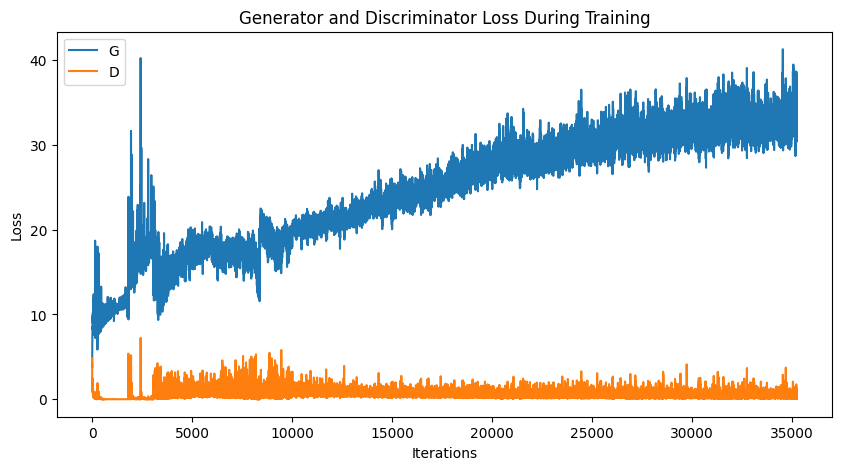

In [ ]:
# Plot Losses
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

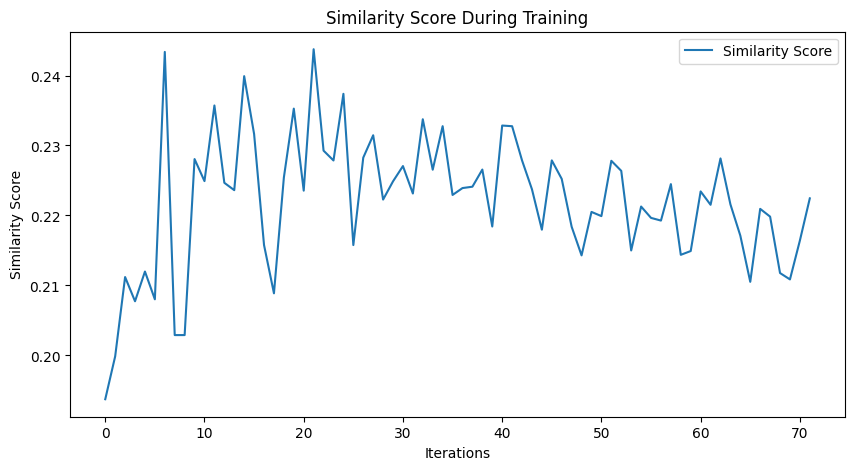

In [ ]:
# Plot Similarity Scores
plt.figure(figsize=(10, 5))
plt.title("Similarity Score During Training")
plt.plot(similarity_scores_over_time, label="Similarity Score")
plt.xlabel("Iterations")
plt.ylabel("Similarity Score")
plt.legend()
plt.show()

In [ ]:
print(len(mg_list))

72


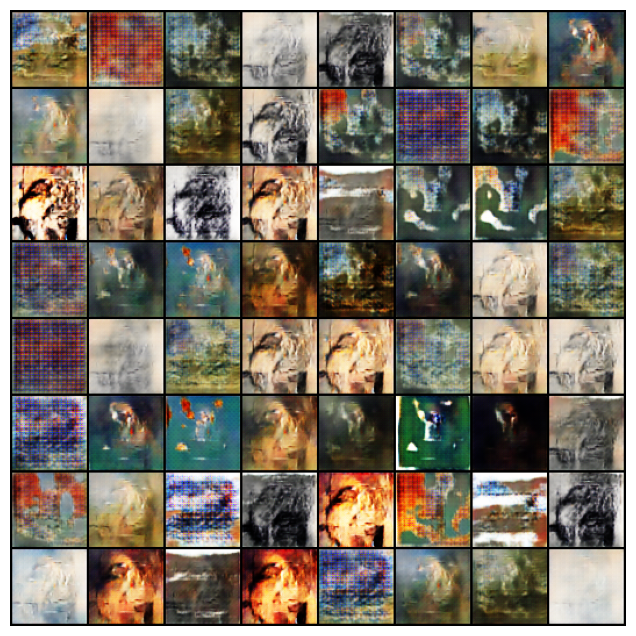

In [ ]:
# Visualize G's Progress
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in mg_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

# Display animation as HTML5 video
HTML(ani.to_html5_video())


In [ ]:
# Save animation as a video file
ani.save('gan_progress.mp4')

# Display the saved video file
from IPython.display import Video
Video('gan_progress.mp4')


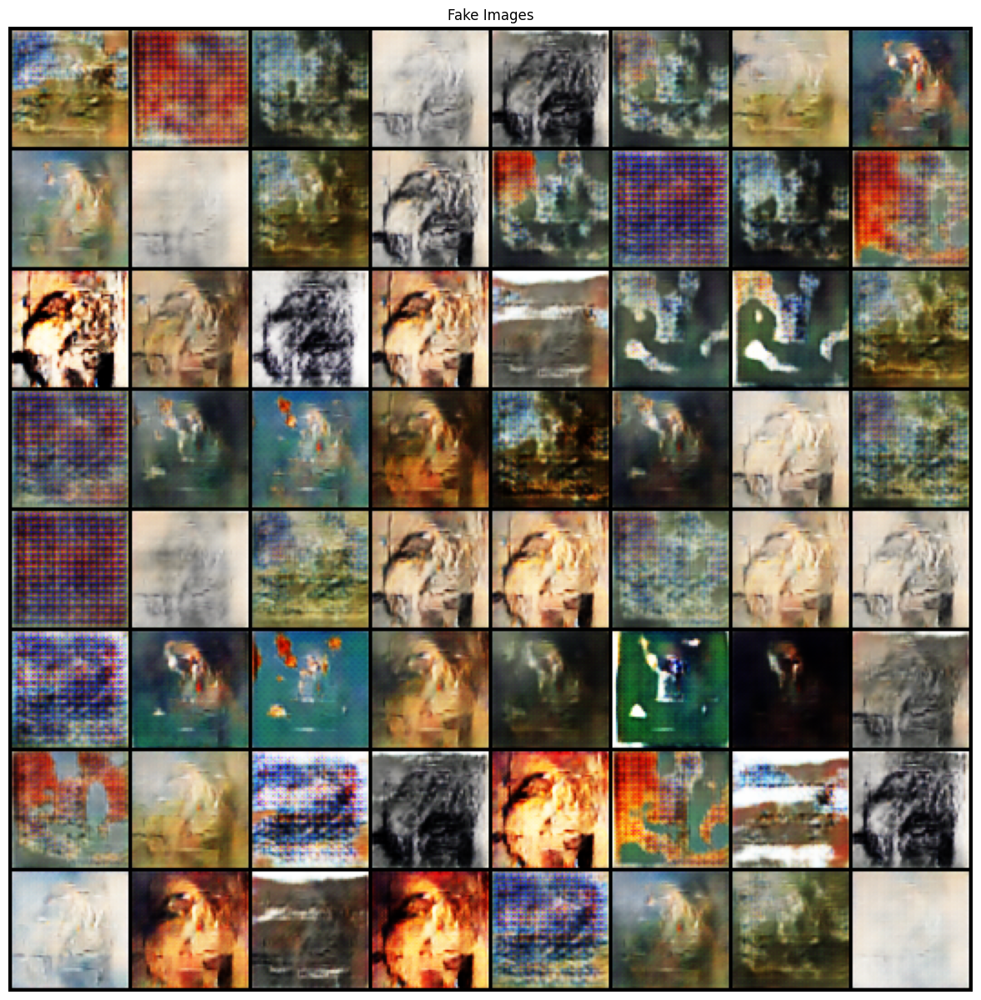

In [ ]:
# Real vs Fake
# Grab a batch of real images from the dataloader
#real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
#plt.subplot(1,2,1)
#plt.axis("off")
#plt.title("Real Images")
#plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
#plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
# Choose an index within the valid range of img_list
img_index = min(80, len(mg_list) - 1)  # Ensure index is within range
plt.imshow(np.transpose(mg_list[img_index], (1, 2, 0)))
plt.show()

In [ ]:
# Function to save the model
def save_checkpoint(model, optimizer, epoch, filename):
    state = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }
    torch.save(state, filename)
    print(f"Checkpoint saved: {filename}")
# Define the path to your Google Drive folder
drive_path = '/content/drive/MyDrive/ModelCheckpoints/'

# Create the directory if it doesn't exist
os.makedirs(drive_path, exist_ok=True)

# Save the models after training to Google Drive
save_checkpoint(netG, optimizerG, num_epochs, os.path.join(drive_path, 'woman2_generator_checkpoint.pth'))
save_checkpoint(netD, optimizerD, num_epochs, os.path.join(drive_path, 'woman2_discriminator_checkpoint.pth'))

Checkpoint saved: /content/drive/MyDrive/ModelCheckpoints/woman2_generator_checkpoint.pth
Checkpoint saved: /content/drive/MyDrive/ModelCheckpoints/woman2_discriminator_checkpoint.pth
